
## Initialize (Segment Anything Model) SAM system, select single point for ROI based on model of the machine.

In [ ]:
import os
HOME = os.getcwd()

In [ ]:
!{sys.executable} -m pip install opencv-python matplotlib
!{sys.executable} -m pip install 'git+https://github.com/facebookresearch/segment-anything.git'
!mkdir -p {HOME}/weights
!pip install -q 'git+https://github.com/facebookresearch/segment-anything.git'
!pip install -q jupyter_bbox_widget roboflow dataclasses-json supervision
!wget -q https://dl.fbaipublicfiles.com/segment_anything/sam_vit_h_4b8939.pth -P {HOME}/weights
!mkdir images
!wget -P images https://raw.githubusercontent.com/facebookresearch/segment-anything/main/notebooks/images/truck.jpg
!wget -P images https://raw.githubusercontent.com/facebookresearch/segment-anything/main/notebooks/images/groceries.jpg
!wget https://dl.fbaipublicfiles.com/segment_anything/sam_vit_h_4b8939.pth
!pip install easyocr

/bin/bash: line 1: {sys.executable}: command not found
/bin/bash: line 1: {sys.executable}: command not found
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 367.8/367.8 kB 7.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 70.2/70.2 kB 8.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 86.7/86.7 kB 7.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 158.3/158.3 kB 11.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 178.7/178.7 kB 11.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 7.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.1/49.1 MB 17.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.5/54.5 kB 6.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.4/49.4 kB 6.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 63.3 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not

In [ ]:
import torch
import torchvision
import sys
import numpy as np
import matplotlib.pyplot as plt
import cv2
from google.colab import drive
import re
import easyocr

In [ ]:
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
CHECKPOINT_PATH = os.path.join(HOME, "weights", "sam_vit_h_4b8939.pth")
print(CHECKPOINT_PATH, "; exist:", os.path.isfile(CHECKPOINT_PATH))
MODEL_TYPE = "vit_h"
from segment_anything import sam_model_registry, SamAutomaticMaskGenerator, SamPredictor
sam = sam_model_registry[MODEL_TYPE](checkpoint=CHECKPOINT_PATH)

/content/weights/sam_vit_h_4b8939.pth ; exist: True


In [ ]:
def show_mask(mask, ax, random_color=False):
    if random_color:
        color = np.concatenate([np.random.random(3), np.array([0.6])], axis=0)
    else:
        color = np.array([30/255, 144/255, 255/255, 0.6])
    h, w = mask.shape[-2:]
    mask_image = mask.reshape(h, w, 1) * color.reshape(1, 1, -1)
    ax.imshow(mask_image)

def show_points(coords, labels, ax, marker_size=375):
    pos_points = coords[labels==1]
    neg_points = coords[labels==0]
    ax.scatter(pos_points[:, 0], pos_points[:, 1], color='green', marker='*', s=marker_size, edgecolor='white', linewidth=1.25)
    ax.scatter(neg_points[:, 0], neg_points[:, 1], color='red', marker='*', s=marker_size, edgecolor='white', linewidth=1.25)

def show_box(box, ax):
    x0, y0 = box[0], box[1]
    w, h = box[2] - box[0], box[3] - box[1]
    ax.add_patch(plt.Rectangle((x0, y0), w, h, edgecolor='green', facecolor=(0,0,0,0), lw=2))

In [ ]:
def extract_images(directory):
    image_files = []
    for file in os.listdir(directory):
        if file.endswith(".jpeg") or file.endswith(".jpg"):
            image_files.append(os.path.join(directory, file))
    return image_files

image_directory = '/content/drive/MyDrive/ROTATED IMAGES/Output'
image_files = extract_images(image_directory)
for image_file in image_files:
    print(image_file)

/content/drive/MyDrive/ROTATED IMAGES/Output/medicakolkata_ccu2_mon--4_2022_6_20_18_4_38.jpeg
/content/drive/MyDrive/ROTATED IMAGES/Output/medicakolkata_ccu2_mon--4_2022_6_20_17_4_43.jpeg
/content/drive/MyDrive/ROTATED IMAGES/Output/medicakolkata_ccu2_mon--4_2022_6_20_16_4_31.jpeg
/content/drive/MyDrive/ROTATED IMAGES/Output/medicakolkata_ccu2_mon--4_2022_6_20_15_4_21.jpeg
/content/drive/MyDrive/ROTATED IMAGES/Output/medicakolkata_ccu2_mon--4_2022_6_20_14_4_11.jpeg
/content/drive/MyDrive/ROTATED IMAGES/Output/medicakolkata_ccu2_mon--4_2022_6_8_10_6_44.jpeg
/content/drive/MyDrive/ROTATED IMAGES/Output/medicakolkata_ccu2_mon--4_2022_6_8_11_6_38.jpeg
/content/drive/MyDrive/ROTATED IMAGES/Output/medicakolkata_ccu2_mon--4_2022_6_8_9_6_37.jpeg


## MONITOR 1: Mask everything except selected region. Segment area, find largest contour, crop image.


#### Extract vitals using rule-based approach and model of machine. Apply Optical Character Recognition, extract data using regex.


Image 0


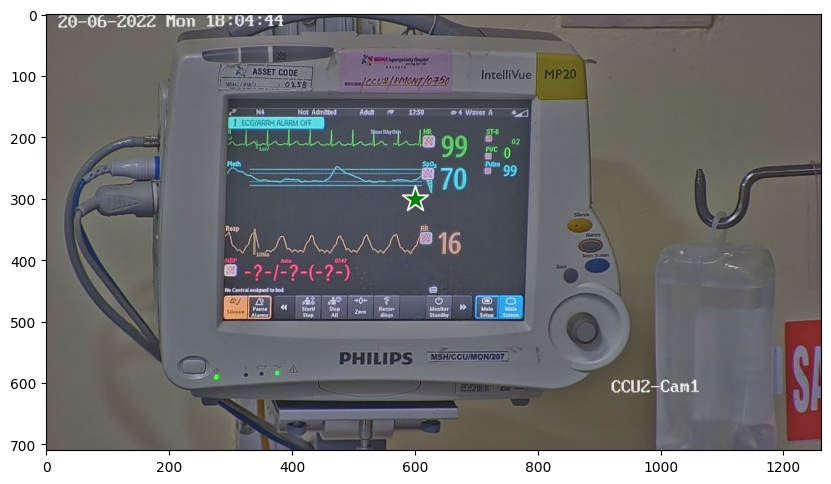

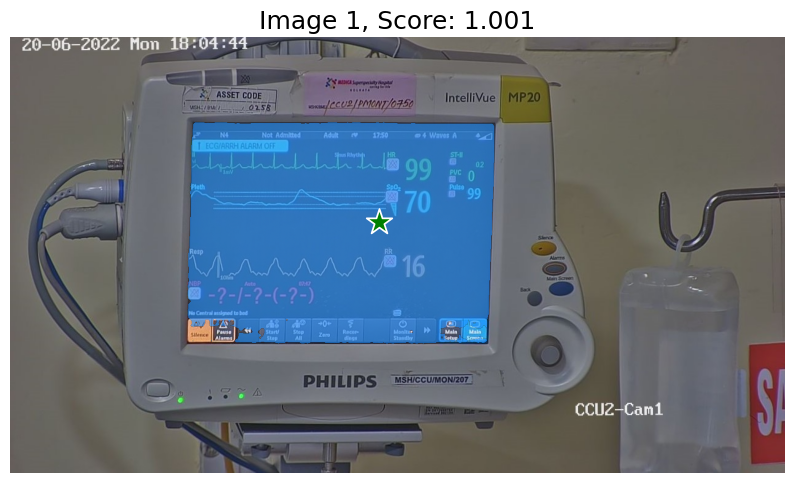

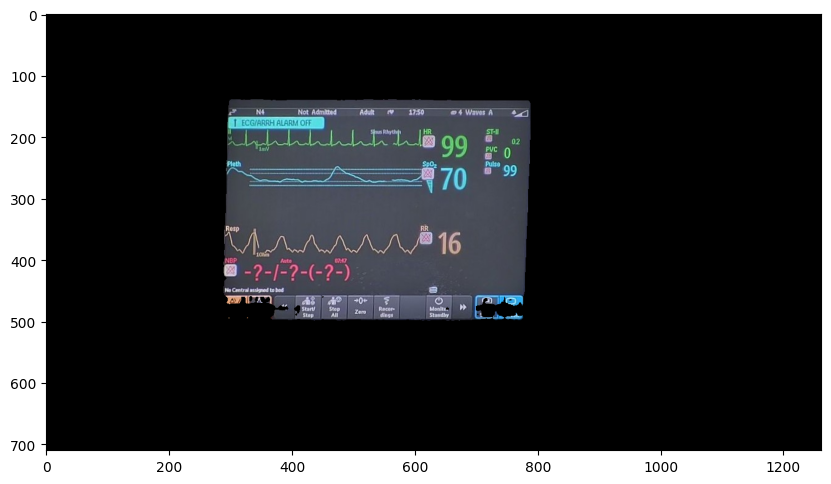

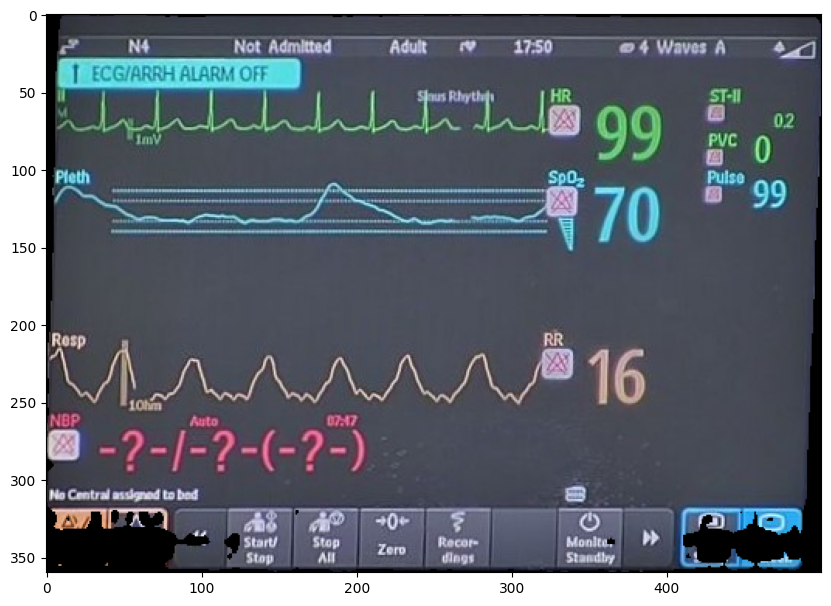

Progress: |██████████████████████████████████████████████████| 100.0% Complete

Progress: |██████████████████████████████████████████████████| 100.0% CompleteHR values: ['99']
SpO2 values: ['70']
RR values: ['16']
[([[0, 14], [94, 14], [94, 46], [0, 46]], '~2-1-2', 0.538193894868318)]
Blood Pressure values: ['NA']
Image 1


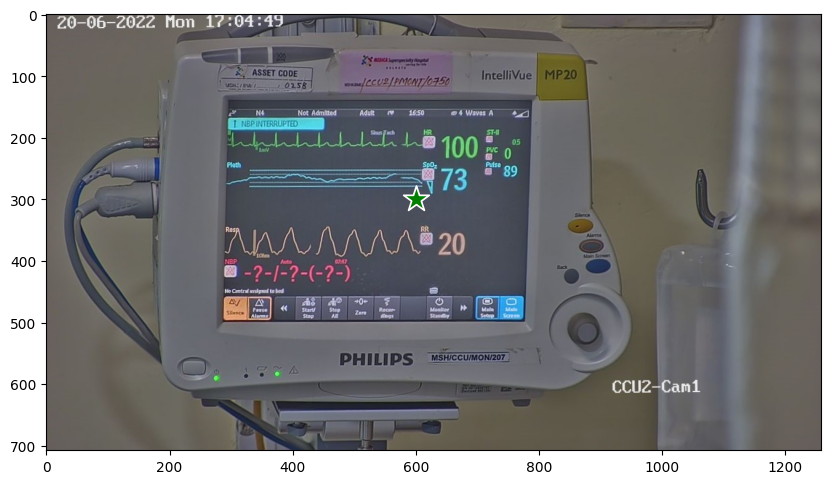

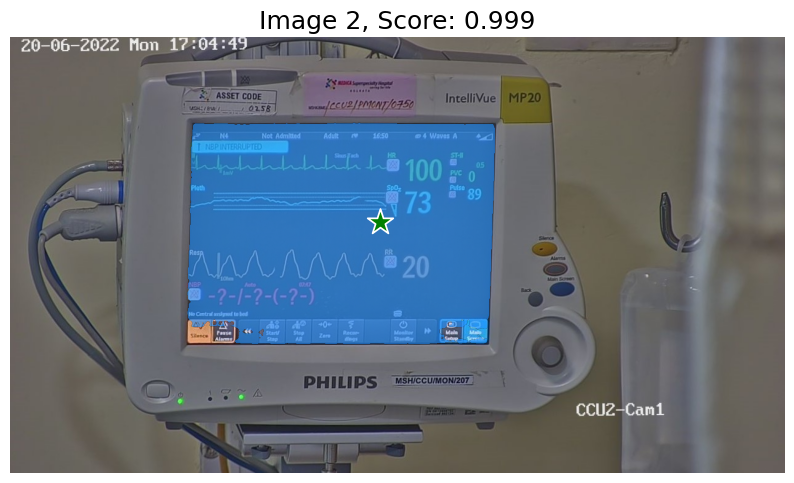

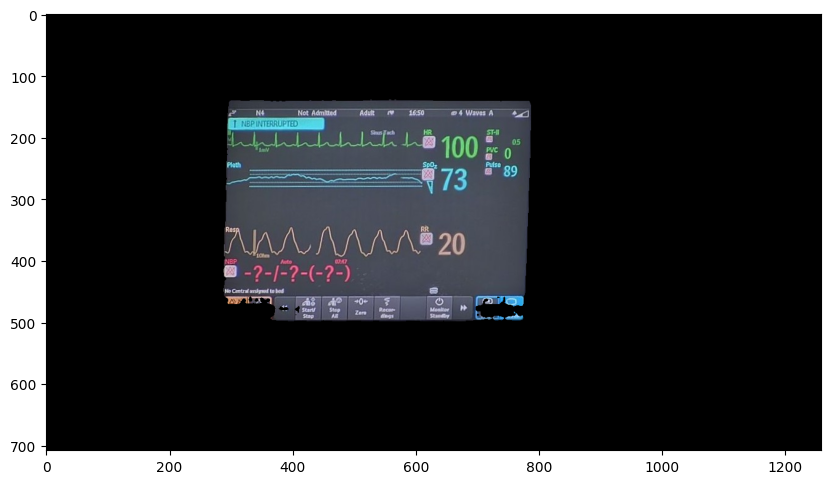

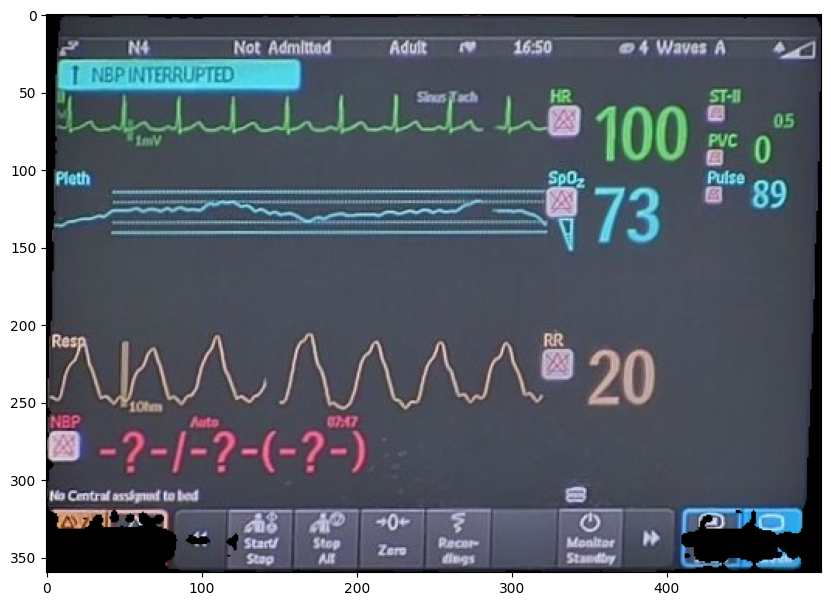

HR values: ['99', '100']
SpO2 values: ['70', '73']
RR values: ['16', '20']
[([[0, 16], [94, 16], [94, 48], [0, 48]], '-2-1-2', 0.39638272024440613)]
Blood Pressure values: ['NA', 'NA']
Image 2


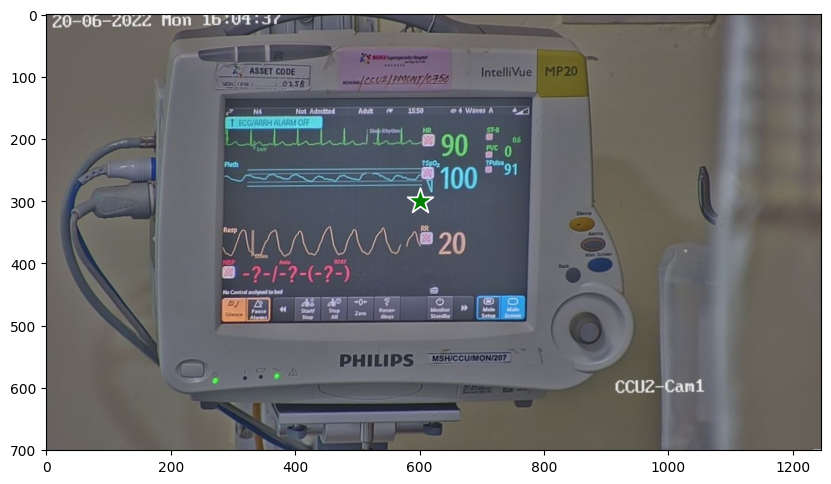

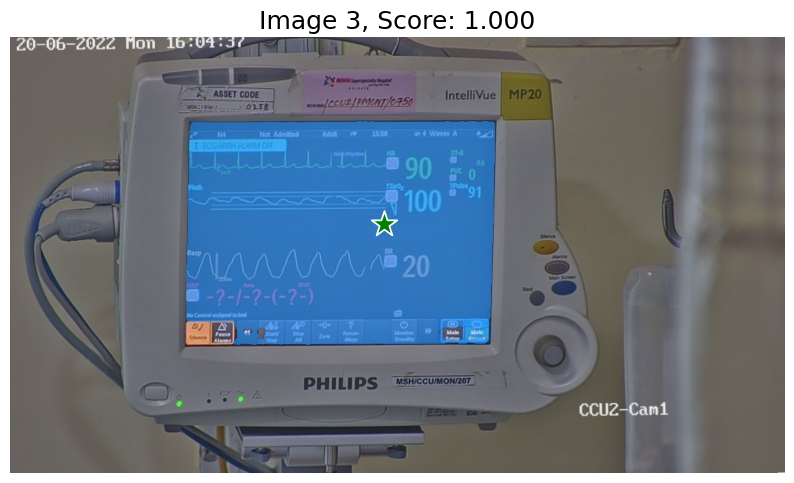

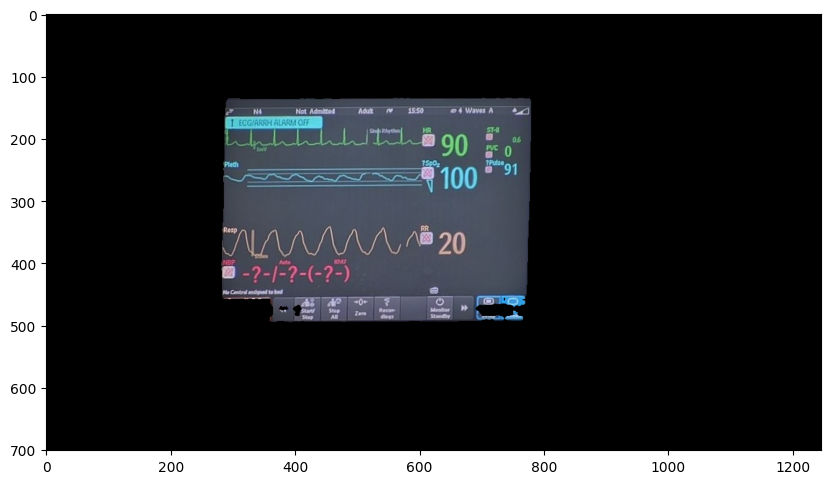

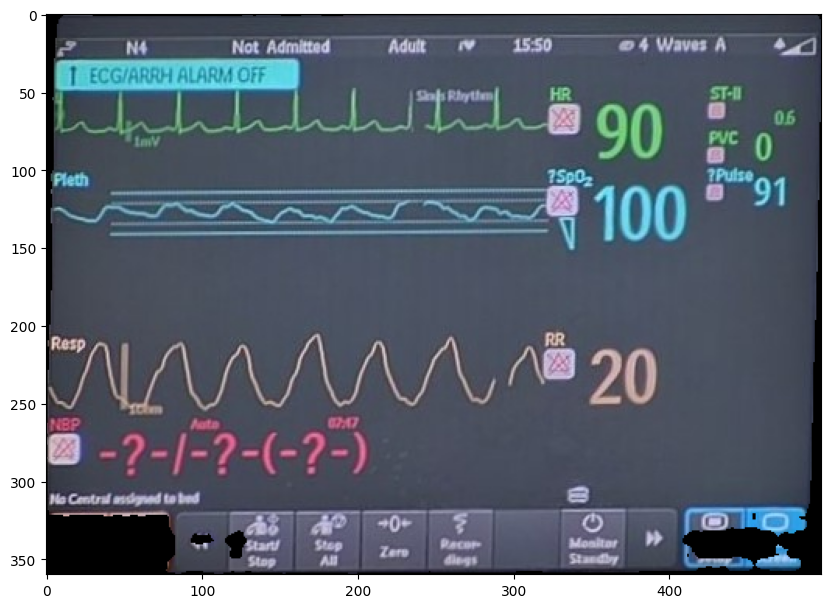

HR values: ['99', '100', '90']
SpO2 values: ['70', '73', '100']
RR values: ['16', '20', '20']
[([[0, 5], [98, 5], [98, 50], [0, 50]], '-2-172', 0.3143682699429923)]
Blood Pressure values: ['NA', 'NA', 'NA']
Image 3


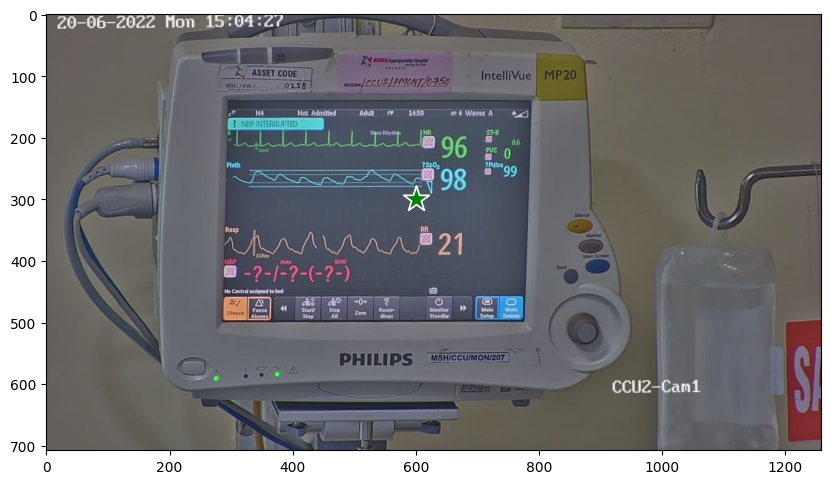

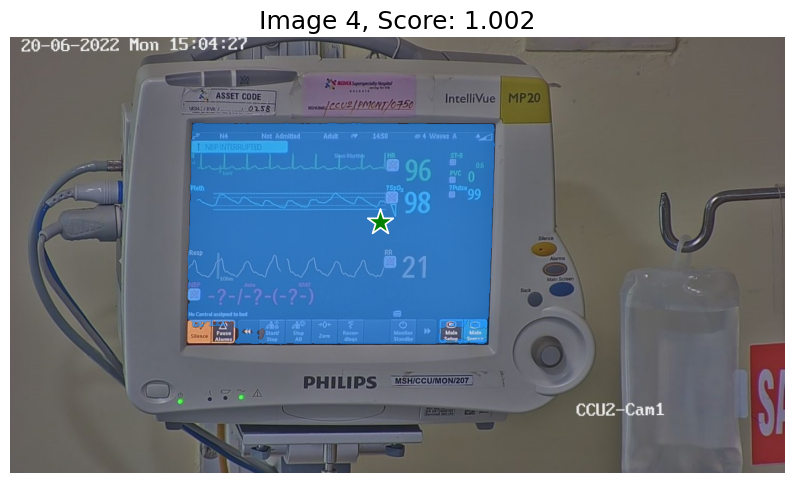

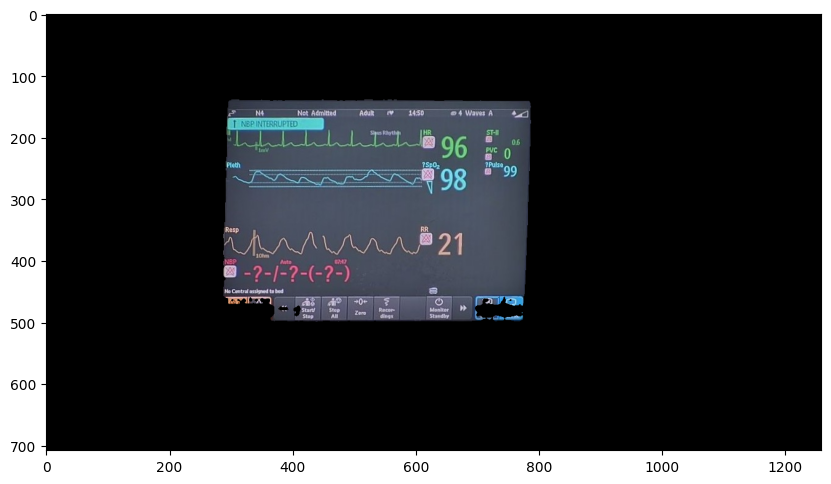

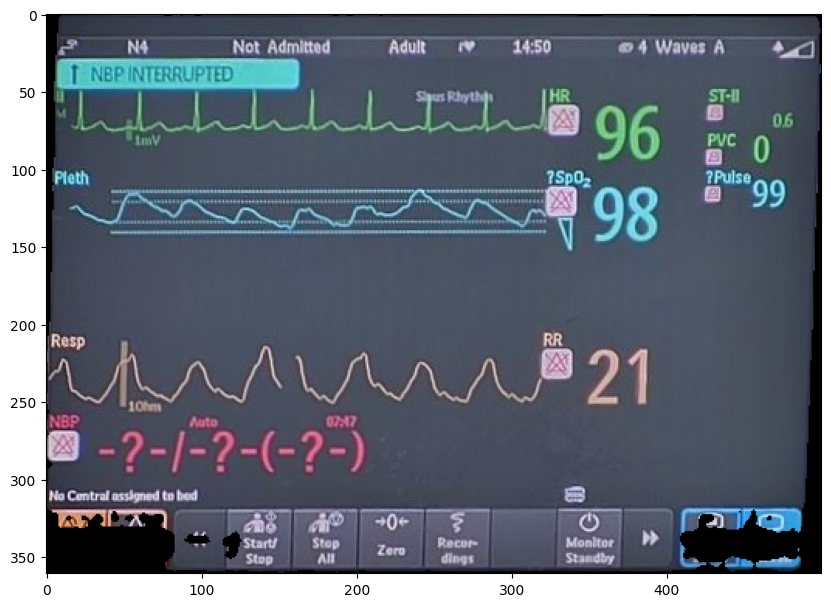

HR values: ['99', '100', '90', '96']
SpO2 values: ['70', '73', '100', '98']
RR values: ['16', '20', '20', '21']
[([[0, 16], [94, 16], [94, 48], [0, 48]], '-2-1-2', 0.4067562689364743)]
Blood Pressure values: ['NA', 'NA', 'NA', 'NA']
Image 4


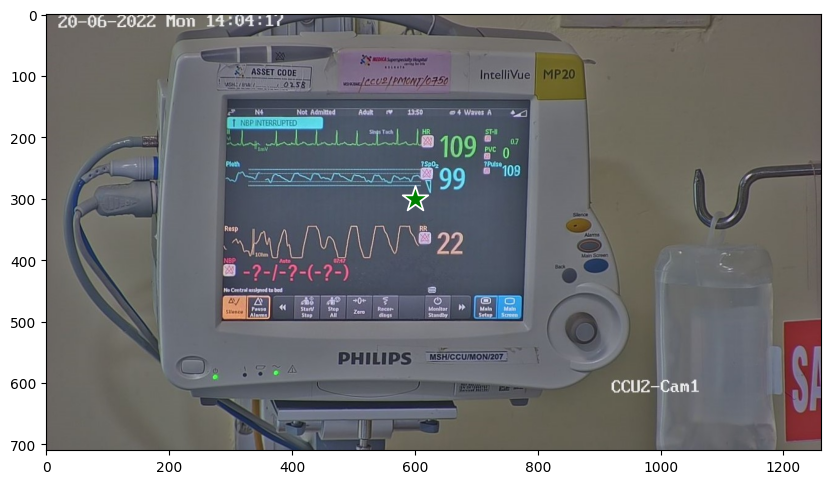

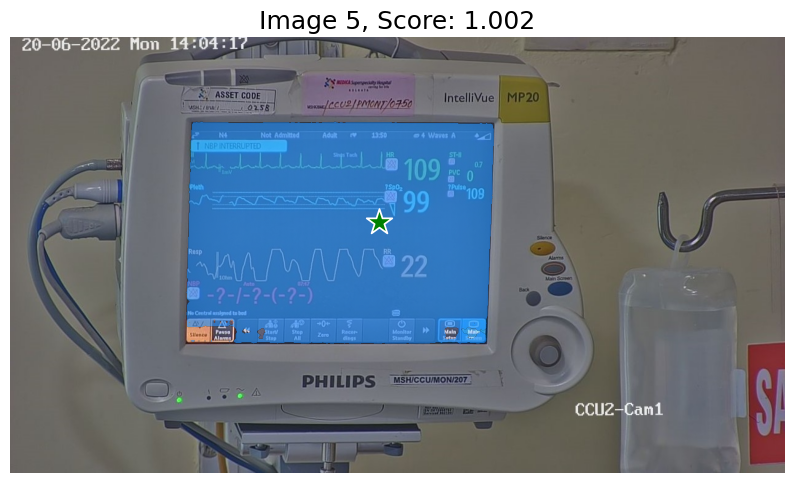

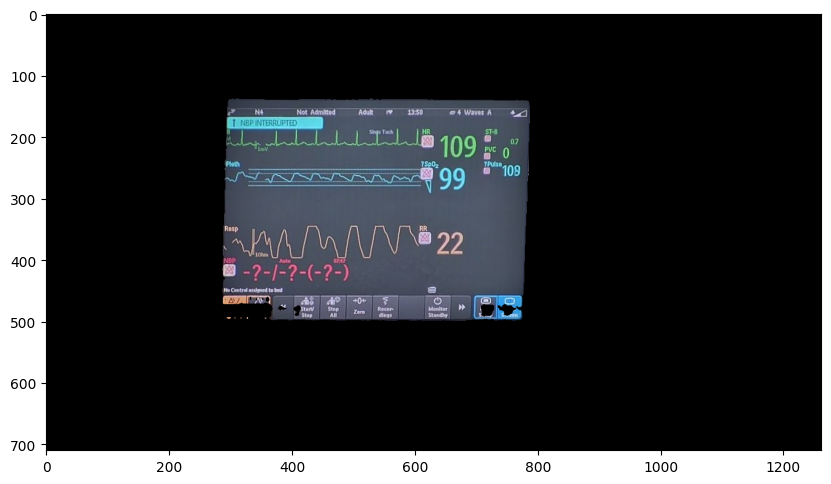

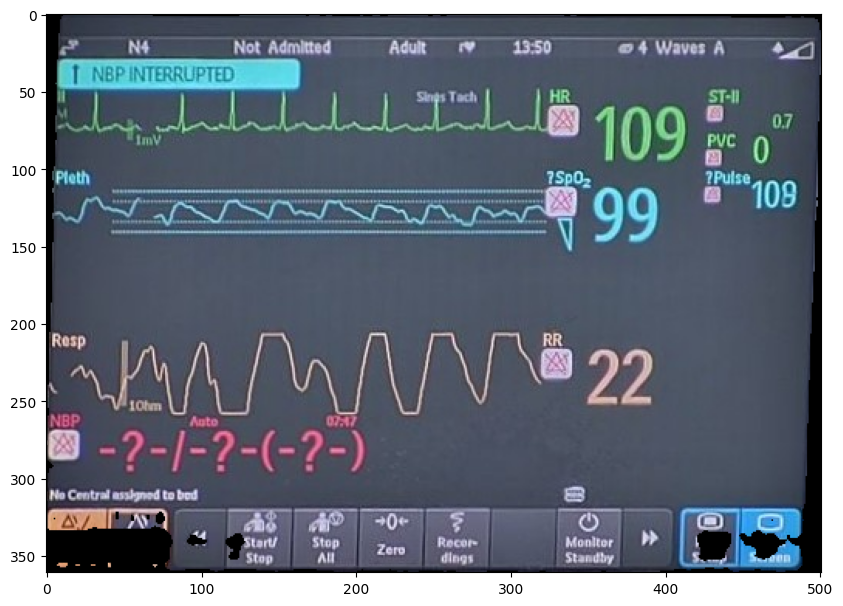

HR values: ['99', '100', '90', '96', '109']
SpO2 values: ['70', '73', '100', '98', '99']
RR values: ['16', '20', '20', '21', '22']
[([[11, 0], [65, 0], [65, 11], [11, 11]], 'ion U', 0.12227885101849495), ([[2, 16], [96, 16], [96, 48], [2, 48]], '-2-1-2', 0.34455400803515857)]
Blood Pressure values: ['NA', 'NA', 'NA', 'NA', 'NA']
Image 5


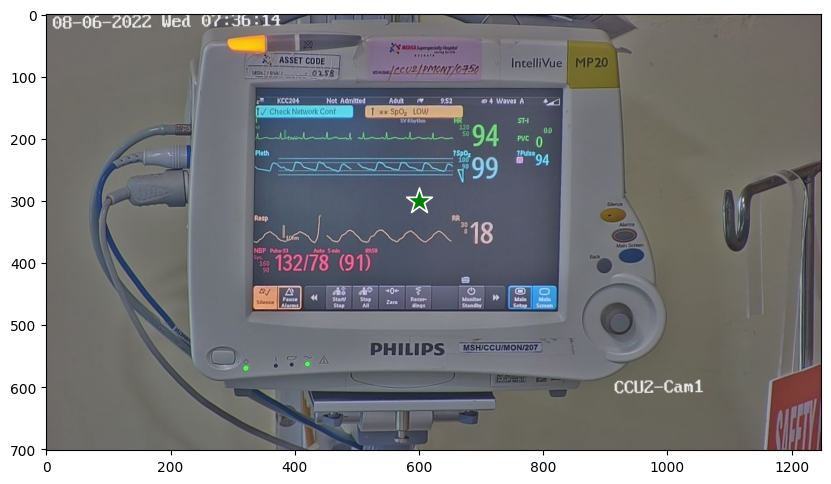

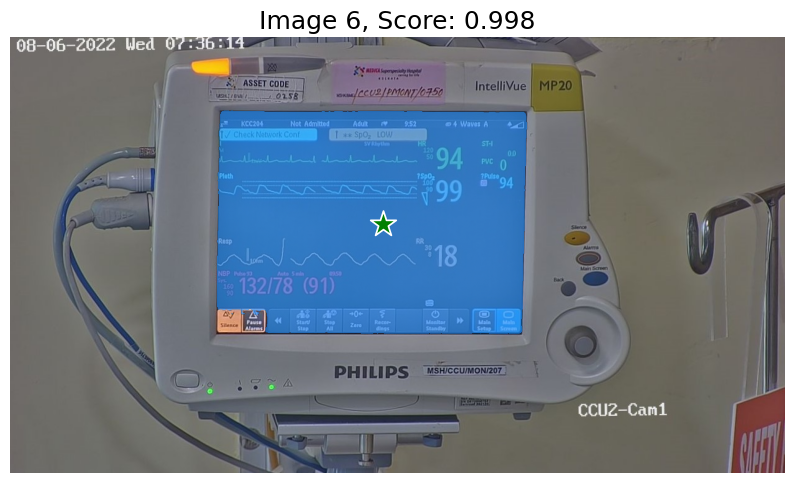

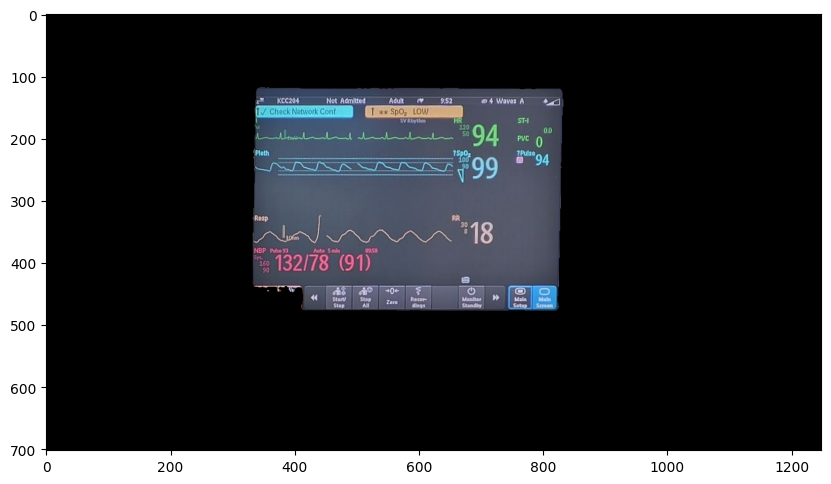

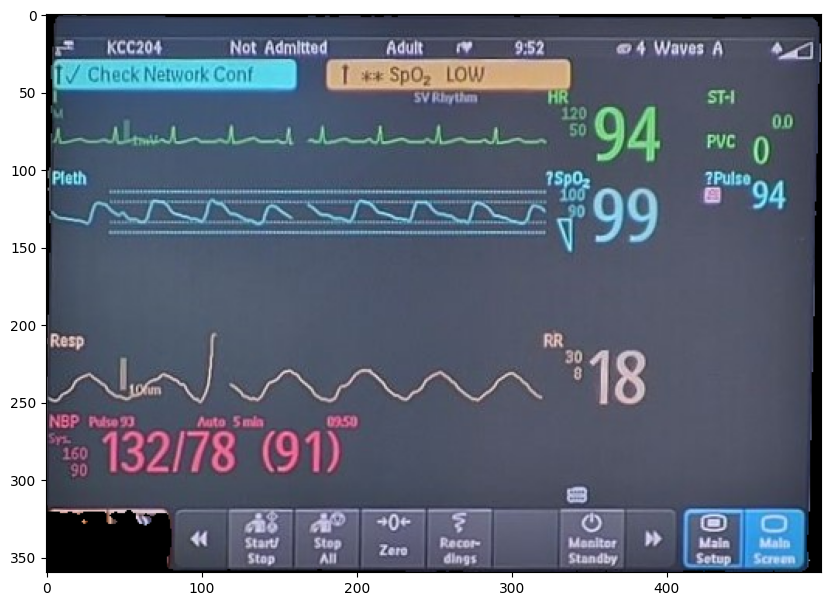

HR values: ['99', '100', '90', '96', '109', '94']
SpO2 values: ['70', '73', '100', '98', '99', '99']
RR values: ['16', '20', '20', '21', '22', '818']
[([[0, 9], [99, 9], [99, 50], [0, 50]], '132/78', 0.9591426830893068)]
Blood Pressure values: ['NA', 'NA', 'NA', 'NA', 'NA', '132/78']
Image 6


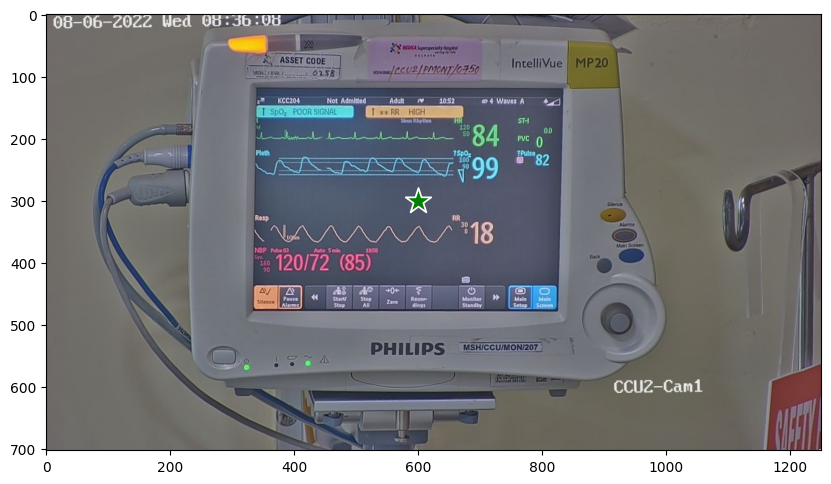

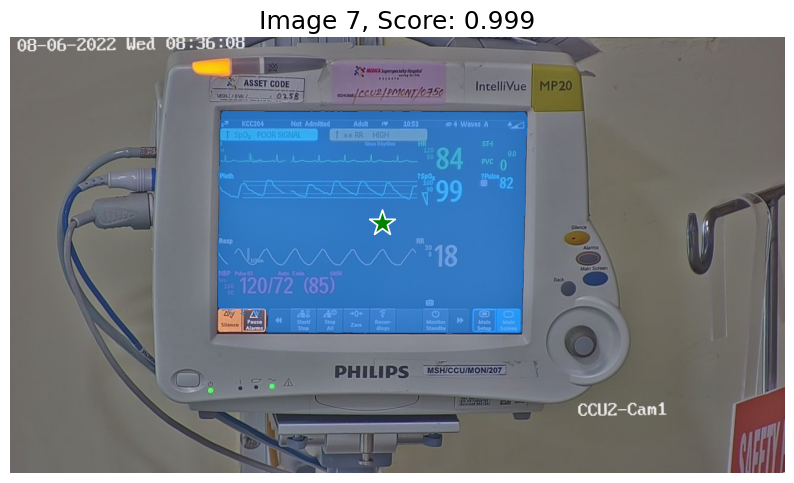

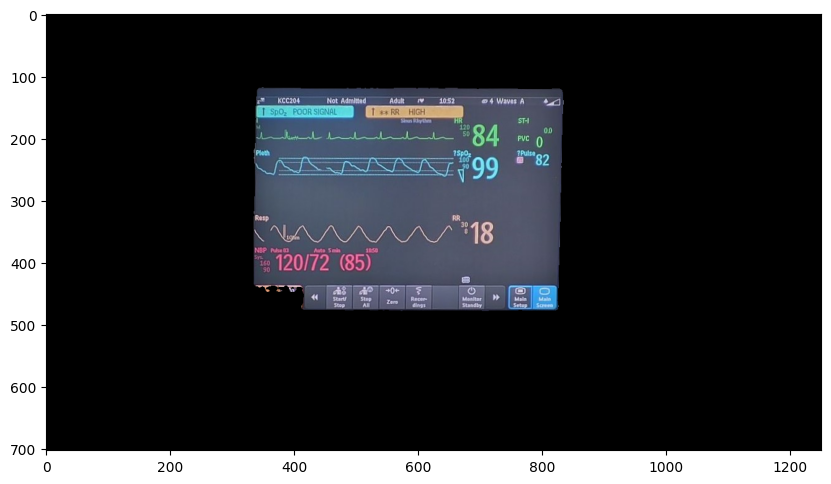

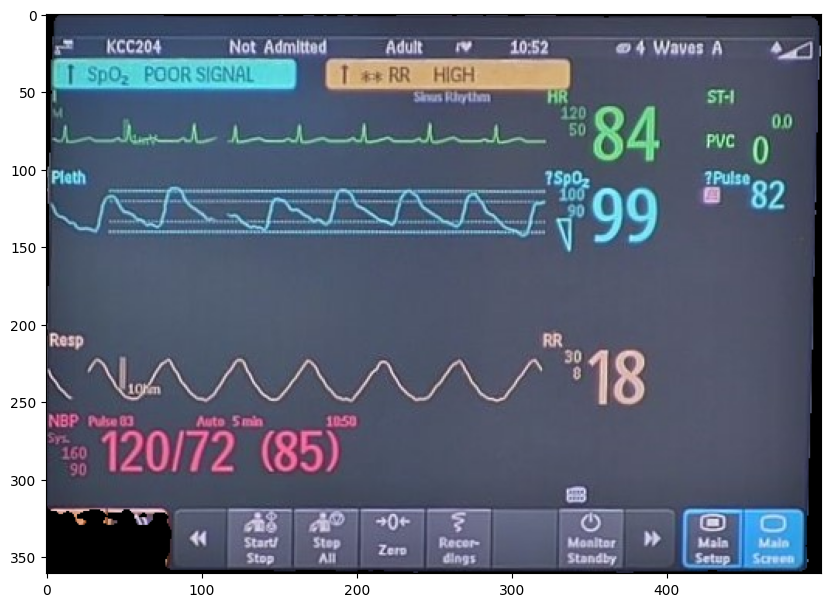

HR values: ['99', '100', '90', '96', '109', '94', '84']
SpO2 values: ['70', '73', '100', '98', '99', '99', '99']
RR values: ['16', '20', '20', '21', '22', '818', '18']
[([[0, 11], [97, 11], [97, 50], [0, 50]], '120/72', 0.9987570661191715)]
Blood Pressure values: ['NA', 'NA', 'NA', 'NA', 'NA', '132/78', '120/72']
Image 7


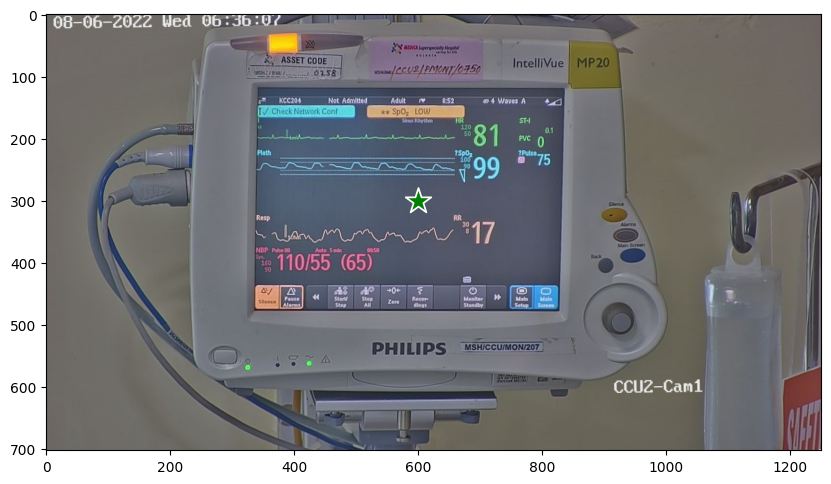

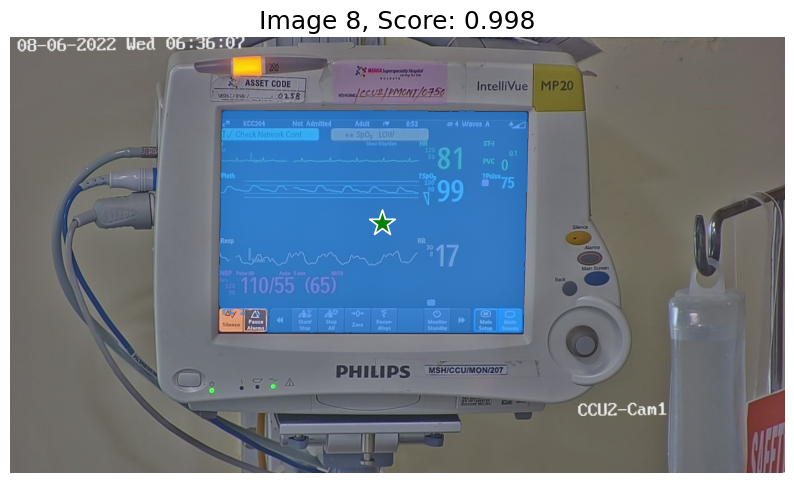

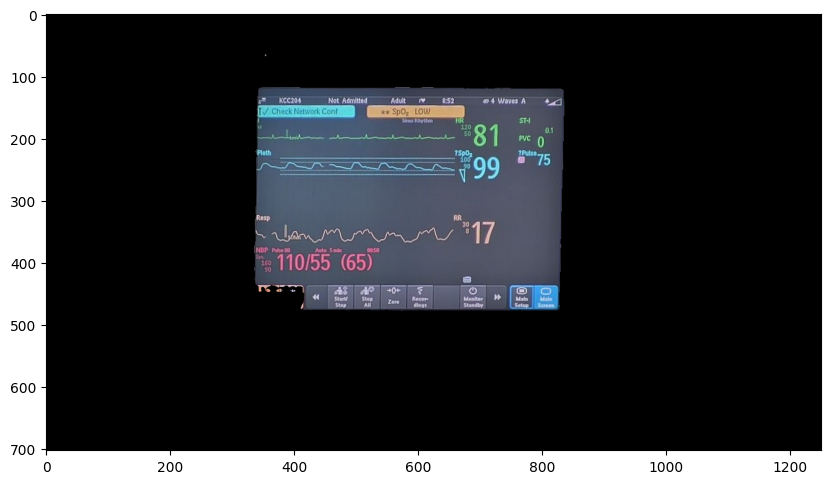

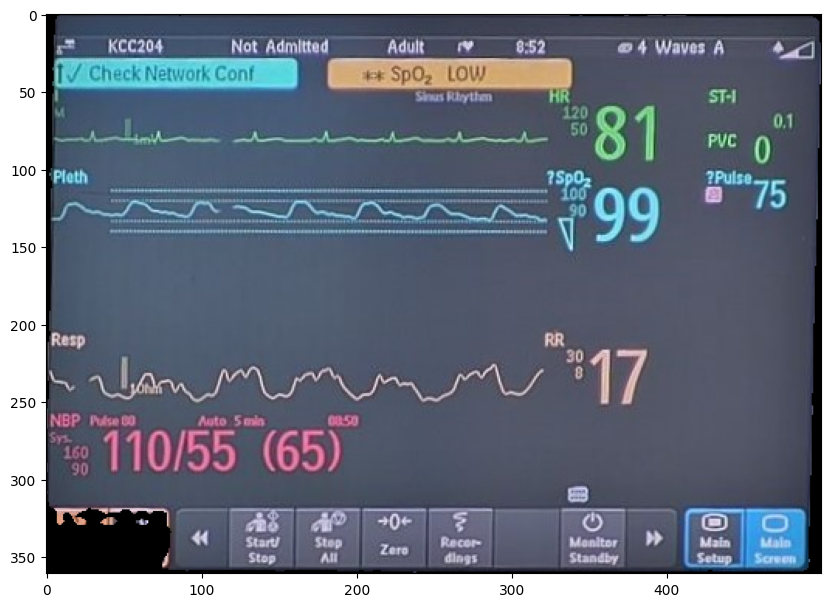

HR values: ['99', '100', '90', '96', '109', '94', '84', '81']
SpO2 values: ['70', '73', '100', '98', '99', '99', '99', '99']
RR values: ['16', '20', '20', '21', '22', '818', '18', '817']
[([[0, 9], [99, 9], [99, 50], [0, 50]], '110/55', 0.8685170969061201)]
Blood Pressure values: ['NA', 'NA', 'NA', 'NA', 'NA', '132/78', '120/72', '110/55']


In [ ]:
import cv2
import easyocr
import os
import re
import numpy as np
import matplotlib.pyplot as plt

def save_image_with_mask(image, output_file):
    cv2.imwrite(output_file, cv2.cvtColor(image, cv2.COLOR_RGB2BGR))


def extract_hr(cropped_image):
    reader = easyocr.Reader(['en'])
    x_hr_min, x_hr_max = 340, 430
    y_hr_min, y_hr_max = 50, 100
    roi = cropped_image[y_hr_min:y_hr_max, x_hr_min:x_hr_max]
    result = reader.readtext(roi)
    hr_values = []
    for detection in result:
        bbox = detection[0]
        width = bbox[2][0] - bbox[0][0]
        height = bbox[2][1] - bbox[0][1]
        min_width = 20
        min_height = 20
        if width >= min_width and height >= min_height:
            text = detection[1]
            if any(char.isdigit() for char in text):
                numbers = re.findall(r'\b\d+\b|\?', text)
                hr_values.extend(numbers)
            else:
                hr_values.append("NA")
        else:
            hr_values.append("NA")
    return hr_values

def extract_spo2(cropped_image):
    reader = easyocr.Reader(['en'])
    x_sp_min, x_sp_max = 340, 430
    y_sp_min, y_sp_max = 100, 150
    roi = cropped_image[y_sp_min:y_sp_max, x_sp_min:x_sp_max]
    result = reader.readtext(roi)
    spo2_values = []
    for detection in result:
        bbox = detection[0]
        width = bbox[2][0] - bbox[0][0]
        height = bbox[2][1] - bbox[0][1]
        min_width = 20
        min_height = 20
        if width >= min_width and height >= min_height:
            text = detection[1]
            numbers = re.findall(r'\b\d+\b|\?', text)
            if any(char.isdigit() for char in text):
                numbers = re.findall(r'\b\d+\b|\?', text)
                spo2_values.extend(numbers)
            else:
                spo2_values.append("NA")
        else:
          spo2_values.append("NA")
    return spo2_values

def extract_rr(cropped_image):
    reader = easyocr.Reader(['en'])
    x_rr_min, x_rr_max = 340, 430
    y_rr_min, y_rr_max = 200, 250
    roi = cropped_image[y_rr_min:y_rr_max, x_rr_min:x_rr_max]
    result = reader.readtext(roi)
    rr_values = []
    for detection in result:
        bbox = detection[0]
        width = bbox[2][0] - bbox[0][0]
        height = bbox[2][1] - bbox[0][1]
        min_width = 20
        min_height = 20
        if width >= min_width and height >= min_height:
            text = detection[1]
            if any(char.isdigit() for char in text):
                numbers = re.findall(r'\b\d+\b|\?', text)
                rr_values.extend(numbers)
            else:
                rr_values.append("NA")
        else:
            rr_values.append("NA")
    return rr_values

def extract_blood_pressure(cropped_image):
    reader = easyocr.Reader(['en'])
    x_BP_min, x_BP_max = 30,130
    y_BP_min, y_BP_max = 250, 300
    roi = cropped_image[y_BP_min:y_BP_max, x_BP_min:x_BP_max]
    result = reader.readtext(roi)
    print(result)
    bp_values = []
    for detection in result:
        bbox = detection[0]
        width = bbox[2][0] - bbox[0][0]
        height = bbox[2][1] - bbox[0][1]
        min_width = 20
        min_height = 20
        if width >= min_width and height >= min_height:
            text = detection[1]
            numbers = re.findall(r'\b\d+/\d+\b', text)
            if not numbers:
                bp_values.append("NA")
            else:
                numbers = re.findall(r'\b\d+/\d+\b', text)
                bp_values.extend(numbers)
    return bp_values

output_directory = '/content/drive/MyDrive/ROTATED IMAGES/SegmentedImage'
os.makedirs(output_directory, exist_ok=True)

HR = []
Spo2 = []
RR = []
BP = []
count = 0
for image_file in image_files:
    print("Image", count)
    count = count + 1
    predictor = SamPredictor(sam)
    image = cv2.imread(image_file)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    input_point = np.array([[600, 300]])
    input_label = np.array([1])
    plt.figure(figsize=(10,10))
    plt.imshow(image)
    show_points(input_point, input_label, plt.gca())
    plt.axis('on')
    plt.show()
    predictor.set_image(image)
    masks, scores, logits = predictor.predict(point_coords=input_point, point_labels=input_label, multimask_output=True,)
    for i, (mask, score) in enumerate(zip(masks, scores)):
        plt.figure(figsize=(10,10))
        plt.imshow(image)
        show_mask(mask, plt.gca())
        show_points(input_point, input_label, plt.gca())
        plt.title(f"Image {count}, Score: {score:.3f}", fontsize=18)
        plt.axis('off')
        plt.show()
        if i == 0:
            break
    mask_uint8 = mask.astype(np.uint8) * 255
    masked_image = cv2.bitwise_and(image, image, mask=mask_uint8)
    plt.figure(figsize=(10, 10))
    plt.imshow(masked_image)
    plt.axis('on')
    plt.show()
    contours, _ = cv2.findContours(mask_uint8, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    largest_contour = max(contours, key=cv2.contourArea)
    x, y, w, h = cv2.boundingRect(largest_contour)
    cropped_image = masked_image[y:y+h, x:x+w]
    output_file = os.path.join(output_directory, f"image_{count+1}.jpeg")
    save_image_with_mask(cropped_image, output_file)
    plt.figure(figsize=(10, 10))
    plt.imshow(cropped_image)
    plt.axis('on')
    plt.show()

    # Extract HR
    hr_values = extract_hr(cropped_image)
    HR.extend(hr_values)
    print("HR values:", HR)

    # Extract SpO2
    spo2_values = extract_spo2(cropped_image)
    Spo2.extend(spo2_values)
    print("SpO2 values:", Spo2)

    # Extract RR (Respiration Rate)
    rr_values = extract_rr(cropped_image)
    RR.extend(rr_values)
    print("RR values:", RR)

    # Extract Blood Pressure
    bp_values = extract_blood_pressure(cropped_image)
    BP.extend(bp_values)
    print("Blood Pressure values:", BP)


### DIGITAL ECG PDF REPORT GENERATION

In [ ]:
!pip install reportlab

from reportlab.lib import colors
from reportlab.lib.pagesizes import letter
from reportlab.platypus import SimpleDocTemplate, Table, TableStyle, Image, Paragraph
from reportlab.lib.styles import getSampleStyleSheet
import pandas as pd
import matplotlib.pyplot as plt
import io

timestamps = ['13:00:00', '13:00:30', '13:01:00', '13:01:30', '13:02:00', '13:02:30', '13:03:00', '13:03:30', '13:04:00', '13:04:30']

data = {
    'Timestamp': timestamps,
    'HR': HR_values,
    'SpO2': SpO2_values,
    'RR': RR_values,
    'Systolic': ['132', 'NA', '120', '110', '120', '132', '120', '110', '120', '120'],
    'Diastolic': ['78', 'NA', '72', '55', '65', '78', '72', '55', '65', '70']
}

df = pd.DataFrame(data)

pdf_filename = "medical_report.pdf"
logo_path = "logo.png"
person_name = "Davang Sikand"
age = 23

doc = SimpleDocTemplate(pdf_filename, pagesize=letter)
styles = getSampleStyleSheet()

content = []

logo = Image(logo_path, width=200, height=100)
company_name = "SwastyaShare"
content.append(logo)
content.append(Paragraph(company_name, styles['Normal']))

person_info = f"<b>Name:</b> {person_name}, <b>Age:</b> {age}"
content.append(Paragraph(person_info, styles['Normal']))

heading = "<b>Digital ECG Record</b>"
content.append(Paragraph(heading, styles['Title']))

table_data = [
    ["HR", "SpO2", "RR", "SBP", "DBP", "Timestamp", "Inferences"]
]
for index, row in df.iterrows():
    inferences = []
    if int(row['HR']) < 50:
        inferences.append("LOW HR")
    elif int(row['HR']) > 120:
        inferences.append("HIGH HR")

    if int(row['SpO2']) < 90:
        inferences.append("LOW SpO2")
    elif int(row['SpO2']) > 100:
        inferences.append("HIGH SpO2")

    if int(row['RR']) < 8:
        inferences.append("LOW RR")
    elif int(row['RR']) > 30:
        inferences.append("HIGH RR")

    systolic = row['Systolic']
    diastolic = row['Diastolic']
    if systolic != 'NA' and diastolic != 'NA':
        systolic = int(systolic)
        diastolic = int(diastolic)

        if 120 <= systolic < 140 and 80 <= diastolic < 90:
            inferences.append("At Risk (Prehypertension)")
        if systolic >= 140 or diastolic >= 90:
            inferences.append("High Blood Pressure (Hypertension)")

    table_data.append([row['HR'], row['SpO2'], row['RR'], systolic, diastolic, row['Timestamp'], ', '.join(inferences)])

table = Table(table_data, colWidths=[60, 60, 60, 70, 70, 70, 120])

table.setStyle(TableStyle([('BACKGROUND', (0, 0), (-1, 0), colors.lightblue),
                           ('TEXTCOLOR', (0, 0), (-1, 0), colors.white),
                           ('ALIGN', (0, 0), (-1, -1), 'CENTER'),
                           ('FONTNAME', (0, 0), (-1, 0), 'Helvetica-Bold'),
                           ('BOTTOMPADDING', (0, 0), (-1, 0), 12),
                           ('BACKGROUND', (0, 1), (-1, -1), colors.beige),
                           ('GRID', (0, 0), (-1, -1), 1, colors.black)]))

content.append(table)

analysis_heading = "<b>Time Graph Analysis:</b>"
content.append(Paragraph(analysis_heading, styles['Heading1']))

def create_line_graph(data, title, xlabel, ylabel, threshold=None):
    plt.figure(figsize=(8, 4))
    plt.plot(data, marker='o', markersize=4, linestyle='-')
    plt.title(title)
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.grid(True)
    if threshold is not None:
        plt.axhline(y=threshold, color='r', linestyle='--', label='Threshold')
    plt.tight_layout()
    img_bytesio = io.BytesIO()
    plt.savefig(img_bytesio, format='png')
    img_bytesio.seek(0)
    plt.close()
    return Image(img_bytesio, width=400, height=200)

for col in ['HR', 'SpO2', 'RR']:
    graph = create_line_graph(df[col], f"{col} Trend", "Time", col, threshold=None)
    content.append(graph)

doc.build(content)

### MONITOR 2: Mask everything except selected region. Segment area, find largest contour, crop image.

In [ ]:
def extract_images(directory):
    image_files = []
    for file in os.listdir(directory):
        if file.endswith(".jpeg") or file.endswith(".jpg"):
            image_files.append(os.path.join(directory, file))
    return image_files

image_directory = '/content/drive/MyDrive/ROTATED IMAGES/MODEL2'
image_files = extract_images(image_directory)
for image_file in image_files:
    print(image_file)

/content/drive/MyDrive/ROTATED IMAGES/MODEL2/medicakolkata_mau_mon--8_2022_5_18_18_7_59.jpeg
/content/drive/MyDrive/ROTATED IMAGES/MODEL2/medicakolkata_mau_mon--8_2022_5_18_11_7_33.jpeg
/content/drive/MyDrive/ROTATED IMAGES/MODEL2/medicakolkata_mau_mon--8_2022_5_18_17_7_59.jpeg
/content/drive/MyDrive/ROTATED IMAGES/MODEL2/medicakolkata_mau_mon--8_2022_5_18_12_7_35.jpeg
/content/drive/MyDrive/ROTATED IMAGES/MODEL2/medicakolkata_mau_mon--8_2022_5_18_9_7_32.jpeg
/content/drive/MyDrive/ROTATED IMAGES/MODEL2/medicakolkata_mau_mon--8_2022_5_18_7_7_32.jpeg
/content/drive/MyDrive/ROTATED IMAGES/MODEL2/medicakolkata_mau_mon--8_2022_5_18_8_7_30.jpeg
/content/drive/MyDrive/ROTATED IMAGES/MODEL2/medicakolkata_mau_mon--8_2022_5_18_21_7_59.jpeg
/content/drive/MyDrive/ROTATED IMAGES/MODEL2/medicakolkata_mau_mon--8_2022_5_18_20_7_57.jpeg
/content/drive/MyDrive/ROTATED IMAGES/MODEL2/medicakolkata_mau_mon--8_2022_5_18_19_8_14.jpeg


In [ ]:
import cv2
import easyocr
import os
import re
import numpy as np
import matplotlib.pyplot as plt

def save_image_with_mask(image, output_file):
    cv2.imwrite(output_file, cv2.cvtColor(image, cv2.COLOR_RGB2BGR))


def extract_hr(cropped_image):
    reader = easyocr.Reader(['en'])
    x_hr_min, x_hr_max = 380, 450
    y_hr_min, y_hr_max = 50, 100
    roi = cropped_image[y_hr_min:y_hr_max, x_hr_min:x_hr_max]
    result = reader.readtext(roi)
    hr_values = []
    for detection in result:
        bbox = detection[0]
        width = bbox[2][0] - bbox[0][0]
        height = bbox[2][1] - bbox[0][1]
        min_width = 20
        min_height = 20
        if width >= min_width and height >= min_height:
            text = detection[1]
            if any(char.isdigit() for char in text):
                numbers = re.findall(r'\b\d+\b|\?', text)
                hr_values.extend(numbers)
    return hr_values

def extract_spo2(cropped_image):
    reader = easyocr.Reader(['en'])
    x_sp_min, x_sp_max = 395, 450
    y_sp_min, y_sp_max = 130, 180
    roi = cropped_image[y_sp_min:y_sp_max, x_sp_min:x_sp_max]
    result = reader.readtext(roi)
    spo2_values = []
    for detection in result:
        bbox = detection[0]
        width = bbox[2][0] - bbox[0][0]
        height = bbox[2][1] - bbox[0][1]
        min_width = 20
        min_height = 20
        if width >= min_width and height >= min_height:
            text = detection[1]
            numbers = re.findall(r'\b\d+\b|\?', text)
            if any(char.isdigit() for char in text):
                numbers = re.findall(r'\b\d+\b|\?', text)
                spo2_values.extend(numbers)
            else:
                # Append "NA" if no digits are found
                spo2_values.append("NA")
        else:
          spo2_values.append("NA")
    return spo2_values

def extract_rr(cropped_image):
    reader = easyocr.Reader(['en'])
    x_rr_min, x_rr_max = 380, 450
    y_rr_min, y_rr_max = 180, 250
    roi = cropped_image[y_rr_min:y_rr_max, x_rr_min:x_rr_max]
    result = reader.readtext(roi)
    rr_values = []
    for detection in result:
        bbox = detection[0]
        width = bbox[2][0] - bbox[0][0]
        height = bbox[2][1] - bbox[0][1]
        min_width = 20
        min_height = 20
        if width >= min_width and height >= min_height:
            text = detection[1]
            if any(char.isdigit() for char in text):
                numbers = re.findall(r'\b\d+\b|\?', text)
                rr_values.extend(numbers)
            else:
                rr_values.append("NA")
        else:
            rr_values.append("NA")
    return rr_values

def extract_blood_pressure(cropped_image):
    reader = easyocr.Reader(['en'])
    x_BP_min, x_BP_max = 15,120
    y_BP_min, y_BP_max = 250, 300
    roi = cropped_image[y_BP_min:y_BP_max, x_BP_min:x_BP_max]
    result = reader.readtext(roi)
    print(result)
    bp_values = []
    for detection in result:
        bbox = detection[0]
        width = bbox[2][0] - bbox[0][0]
        height = bbox[2][1] - bbox[0][1]
        min_width = 20
        min_height = 20
        if width >= min_width and height >= min_height:
            text = detection[1]
            numbers = re.findall(r'\b\d+/\d+\b', text)
            if not numbers:
                bp_values.append("NA")
            else:
                numbers = re.findall(r'\b\d+/\d+\b', text)
                bp_values.extend(numbers)
    return bp_values

output_directory = '/content/drive/MyDrive/ROTATED IMAGES/Output2'
os.makedirs(output_directory, exist_ok=True)

HR = []
Spo2 = []
RR = []
BP = []
count = 0
for image_file in image_files:
    print("Image", count)
    count = count + 1
    predictor = SamPredictor(sam)
    image = cv2.imread(image_file)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    input_point = np.array([[890, 450]])
    input_label = np.array([1])
    plt.figure(figsize=(10,10))
    plt.imshow(image)
    show_points(input_point, input_label, plt.gca())
    plt.axis('on')
    plt.show()
    predictor.set_image(image)
    masks, scores, logits = predictor.predict(point_coords=input_point, point_labels=input_label, multimask_output=True,)
    for i, (mask, score) in enumerate(zip(masks, scores)):
        plt.figure(figsize=(10,10))
        plt.imshow(image)
        show_mask(mask, plt.gca())
        show_points(input_point, input_label, plt.gca())
        plt.title(f"Image {count}, Score: {score:.3f}", fontsize=18)
        plt.axis('off')
        plt.show()
        if i == 0:
            break
    mask_uint8 = mask.astype(np.uint8) * 255
    masked_image = cv2.bitwise_and(image, image, mask=mask_uint8)
    plt.figure(figsize=(10, 10))
    plt.imshow(masked_image)
    plt.axis('on')
    plt.show()
    contours, _ = cv2.findContours(mask_uint8, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    largest_contour = max(contours, key=cv2.contourArea)
    x, y, w, h = cv2.boundingRect(largest_contour)
    cropped_image = masked_image[y:y+h, x:x+w]
    output_file = os.path.join(output_directory, f"image_{count+1}.jpeg")
    save_image_with_mask(cropped_image, output_file)
    plt.figure(figsize=(10, 10))
    plt.imshow(cropped_image)
    plt.axis('on')
    plt.show()

    # Extract HR
    hr_values = extract_hr(cropped_image)
    HR.extend(hr_values)
    print("HR values:", HR)

    # Extract SpO2
    spo2_values = extract_spo2(cropped_image)
    Spo2.extend(spo2_values)
    print("SpO2 values:", Spo2)

    # Extract RR (Respiration Rate)
    rr_values = extract_rr(cropped_image)
    RR.extend(rr_values)
    print("RR values:", RR)

    # Extract Blood Pressure
    bp_values = extract_blood_pressure(cropped_image)
    BP.extend(bp_values)
    print("Blood Pressure values:", BP)
